In [1]:
# import library
import matplotlib
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import contextily as ctx
import folium
from folium.plugins import MarkerCluster

# 1. Exploring the full data set again

In [3]:
# bring in the CSV and take a look at it
listing_df = pd.read_csv('data/airbnb-listings.csv')
listing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31900 entries, 0 to 31899
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            31900 non-null  int64  
 1   listing_url                                   31900 non-null  object 
 2   scrape_id                                     31900 non-null  int64  
 3   last_scraped                                  31900 non-null  object 
 4   name                                          31899 non-null  object 
 5   description                                   30751 non-null  object 
 6   neighborhood_overview                         20185 non-null  object 
 7   picture_url                                   31900 non-null  object 
 8   host_id                                       31900 non-null  int64  
 9   host_url                                      31900 non-null 

In [8]:
# plot the listings by neighborhood just to take a look
fig = px.scatter_mapbox(listing_df,
                        lat="latitude",
                        lon="longitude",
                        hover_name="name", 
                        color="neighbourhood_cleansed",
                        #hover_data=["neighborhood_overview"], 
                        mapbox_style="carto-positron",
                        title='Airbnb Listings'
                        )
# show the map
fig.show()

In [9]:
# convert to string and lower case
listing_df['neighborhood_overview']=listing_df.neighborhood_overview.astype(str)
listing_df['neighborhood_overview']=listing_df.neighborhood_overview.str.lower()

In [10]:
# function to check if a listing contains a word
def check_words(description, word):
    if word in description:
        n = True
    else:
        n = False
    return n

In [11]:
#Words for Adjectives: Safe, Quiet, Beautiful, Exclusive, Famous
#Words for Amenities: Restaurants, Shop, Art, Trail, Views
#Words for Mobility: Walk, Drive, Parking

# iterate over a list of keywords
list = ['safe','quiet','beautiful','exclusive','famous','restaurants','shop','art','trail','views','walk','drive','parking']
  
# getting length of list
length = len(list)

In [12]:
# Iterating the index to add them to the filtered df
for i in range(length):
    listing_df[list[i]]=listing_df.neighborhood_overview.apply(lambda x: check_words(x,list[i]))
    
listing_df.sample(20)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
26209,44380139,https://www.airbnb.com/rooms/44380139,20210207181900,2021-02-07,BRANDNEW 1BROOM IN THE HEART OF HOLLYWOOD,<b>License number</b><br />HSR20-001730,nan,https://a0.muscache.com/pictures/f45b7103-6659...,353008872,https://www.airbnb.com/users/show/353008872,...,False,False,False,False,False,False,False,False,False,False
22592,40331566,https://www.airbnb.com/rooms/40331566,20210207181900,2021-02-10,New Modern Home w/ Best Location & Free Parking,"NEW Luxury Modern, & Spacious condo. Fully equ...",the place is located in the heart of woodland ...,https://a0.muscache.com/pictures/fa75dfe6-fc5d...,74398610,https://www.airbnb.com/users/show/74398610,...,False,False,True,True,True,False,False,True,False,False
19410,35852006,https://www.airbnb.com/rooms/35852006,20210207181900,2021-02-09,赴美生子 独立公寓,只接待赴美生子!公寓安全，私密性强，位置很好，旁边都是中国超市。这是我结婚时常租的房子，现在...,nan,https://a0.muscache.com/pictures/c8d8a3d6-f0e6...,166108821,https://www.airbnb.com/users/show/166108821,...,False,False,False,False,False,False,False,False,False,False
4939,10250068,https://www.airbnb.com/rooms/10250068,20210207181900,2021-02-08,Belmont Shore! 2 mins. from Rosie's Beach!,"Hello travelers! My 1 BR apartment (yes, 1 BR ...",nan,https://a0.muscache.com/pictures/28a12258-d082...,12573490,https://www.airbnb.com/users/show/12573490,...,False,False,False,False,False,False,False,False,False,False
2934,5792141,https://www.airbnb.com/rooms/5792141,20210207181900,2021-02-09,CENTRAL 2BD/2B NEAR THE GROVE,"Luxury 2 Bedroom, 2 bathroom apartment home in...",nan,https://a0.muscache.com/pictures/73584674/6e57...,8203386,https://www.airbnb.com/users/show/8203386,...,False,False,False,False,False,False,False,False,False,False
28854,46221305,https://www.airbnb.com/rooms/46221305,20210207181900,2021-02-09,7 Large Marina penthouse Waterfront.,Great Apartment rodet water Front<br /><br /><...,nan,https://a0.muscache.com/pictures/ae4ad4f6-364f...,27798046,https://www.airbnb.com/users/show/27798046,...,False,False,False,False,False,False,False,False,False,False
27082,45242468,https://www.airbnb.com/rooms/45242468,20210207181900,2021-02-09,Live + Work + Stay + Easy | 2BR in Los Angeles,Stay for 90+ nights (minimum nights and rates ...,nan,https://a0.muscache.com/pictures/86901b5b-a77a...,359066913,https://www.airbnb.com/users/show/359066913,...,False,False,False,False,False,False,False,False,False,False
15056,28335429,https://www.airbnb.com/rooms/28335429,20210207181900,2021-02-09,Family Home in Laurel Canyon,"The family home is located in Laurel Canyon, a...",laurel canyon is an iconic neighborhood in the...,https://a0.muscache.com/pictures/7a256f0f-1b68...,17800515,https://www.airbnb.com/users/show/17800515,...,False,True,True,False,False,False,True,True,True,False
5321,11360960,https://www.airbnb.com/rooms/11360960,20210207181900,2021-02-09,3 BD/2 BA VENICE BEACH PERFECTION,STUNNING 3 BEDROOM /2 BATHROOM HOUSE + DEN <br...,nan,https://a0.muscache.com/pictures/3ced45aa-8ee8...,1319775,https://www.airbnb.com/users/show/1319775,...,False,False,False,False,False,False,False,False,False,False
9401,19271622,https://www.airbnb.com/rooms/19271622,20210207181900,2021-02-10,"Colorful Venice Beach Studio, steps from Board...","Cozy studio with loft, steps from the Venice B...",venice was founded in 1905 as a seaside resort...,https://a0.muscache.com/pictures/4519c829-05a8...,3202511,https://www.airbnb.com/users/show/3202511,...,False,False,False,False,True,False,False,True,False,False


In [13]:
listing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31900 entries, 0 to 31899
Data columns (total 87 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            31900 non-null  int64  
 1   listing_url                                   31900 non-null  object 
 2   scrape_id                                     31900 non-null  int64  
 3   last_scraped                                  31900 non-null  object 
 4   name                                          31899 non-null  object 
 5   description                                   30751 non-null  object 
 6   neighborhood_overview                         31900 non-null  object 
 7   picture_url                                   31900 non-null  object 
 8   host_id                                       31900 non-null  int64  
 9   host_url                                      31900 non-null 

In [212]:
# plot the listings by keyword just to take a look
fig = px.scatter_mapbox(listing_df,
                        lat="latitude",
                        lon="longitude",
                        hover_name="name", 
                        color="quiet",
                        color_discrete_sequence=["#ececec", "#e15383"],
                        mapbox_style="carto-positron",
                        title='Airbnb Listings in Quiet Neighborhoods'
                        )
# show the map
fig.show()

# 1.1 group by neighborhood and keywords

In [76]:
def group(keyword):
    by_hoods = listing_df.groupby("neighbourhood_cleansed")[keyword].mean()
    by_hoods_df = pd.DataFrame(by_hoods).reset_index()
    return by_hoods_df

In [90]:
# Group by neighborhood for each of the words
# Words for Adjectives: Safe, Quiet, Beautiful, Exclusive, Famous
# Words for Amenities: Restaurants, Shop, Art, Trail, Views
# Words for Mobility: Walk, Drive, Parking

safe_df = group('safe')
quiet_df = group('quiet')
beautiful_df = group('beautiful')
exclusive_df = group('exclusive')
famous_df = group('famous')
restaurants_df = group('restaurants')
shop_df = group('shop')
art_df = group('art')
trail_df = group('trail')
views_df = group('views')
walk_df = group('walk')
drive_df = group('drive')
parking_df = group('parking')

In [101]:
# join the individual data frames together

hood_words = pd.concat((iDF.set_index('neighbourhood_cleansed') for iDF in [safe_df, quiet_df, beautiful_df, exclusive_df, famous_df, restaurants_df, shop_df, art_df, trails_df, views_df, walk_df, drive_df, parking_df]),
    axis=1, join='inner').reset_index()

hood_words.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 262 entries, 0 to 261
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   neighbourhood_cleansed  262 non-null    object 
 1   safe                    262 non-null    float64
 2   quiet                   262 non-null    float64
 3   beautiful               262 non-null    float64
 4   exclusive               262 non-null    float64
 5   famous                  262 non-null    float64
 6   restaurants             262 non-null    float64
 7   shop                    262 non-null    float64
 8   art                     262 non-null    float64
 9   trail                   262 non-null    float64
 10  views                   262 non-null    float64
 11  walk                    262 non-null    float64
 12  drive                   262 non-null    float64
 13  parking                 262 non-null    float64
dtypes: float64(13), object(1)
memory usage: 28

In [108]:
hood_words.sort_values(by=['beautiful'])

,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Acton,0.000000,0.250000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.0
88,Griffith Park,0.000000,0.222222,0.000000,0.0,0.111111,0.333333,0.222222,0.222222,0.111111,0.111111,0.222222,0.222222,0.0
87,Green Valley,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.111111,0.111111,0.000000,0.000000,0.000000,0.0
86,Green Meadows,0.166667,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.0
194,Sepulveda Basin,0.250000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,West Whittier-Los Nietos,0.142857,0.428571,0.285714,0.0,0.000000,0.142857,0.142857,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
150,North El Monte,0.133333,0.400000,0.333333,0.0,0.000000,0.400000,0.000000,0.200000,0.066667,0.000000,0.400000,0.000000,0.0
2,Agoura Hills,0.119048,0.357143,0.333333,0.0,0.023810,0.285714,0.190476,0.047619,0.166667,0.071429,0.238095,0.190476,0.0
36,Castaic,0.000000,0.615385,0.461538,0.0,0.000000,0.076923,0.076923,0.076923,0.153846,0.076923,0.230769,0.153846,0.0


In [109]:
hood_words.head()

,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Acton,0.000000,0.250000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000
1,Adams-Normandie,0.000000,0.026316,0.000000,0.0,0.000000,0.078947,0.000000,0.052632,0.000000,0.000000,0.052632,0.000000,0.000000
2,Agoura Hills,0.119048,0.357143,0.333333,0.0,0.023810,0.285714,0.190476,0.047619,0.166667,0.071429,0.238095,0.190476,0.000000
3,Agua Dulce,0.062500,0.437500,0.187500,0.0,0.062500,0.125000,0.125000,0.000000,0.000000,0.062500,0.187500,0.187500,0.062500
4,Alhambra,0.140000,0.156667,0.016667,0.0,0.006667,0.180000,0.140000,0.056667,0.000000,0.003333,0.183333,0.046667,0.006667


In [107]:
import plotly.graph_objects as go
hoods = hood_words['neighbourhood_cleansed']
safe = hood_words['safe']
quiet = hood_words['quiet']


fig = go.Figure(data=[
    go.Bar(name='safe', x=hoods, y=[safe]),
    go.Bar(name='quiet', x=hoods, y=[quiet])
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

(0.0, 1.0)

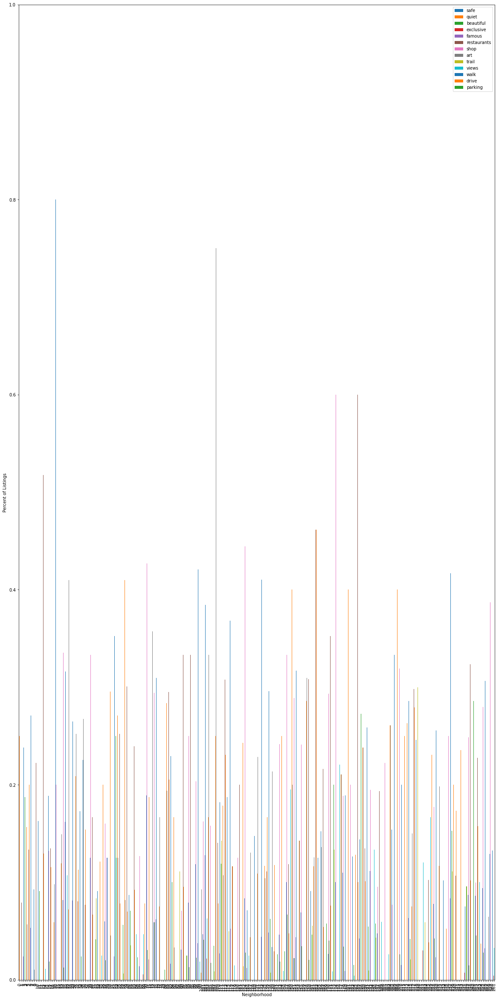

In [114]:
ax = hood_words.plot.bar(stacked=False, figsize=(20,42))
ax.set_ylabel('Percent of Listings', fontsize=10)
ax.set_xlabel('Neighborhood', fontsize=10)
ax.set_ylim(0,1)

In [120]:
import geopandas as gpd
hood_poly=gpd.read_file('data/neighbourhoods.geojson')
hood_poly.head()

,neighbourhood,neighbourhood_group,geometry
0,Angeles Crest,Unincorporated Areas,"MULTIPOLYGON (((-118.09667 34.47348, -118.0796..."
1,Acton,Unincorporated Areas,"MULTIPOLYGON (((-118.20703 34.53902, -118.1894..."
2,Agua Dulce,Unincorporated Areas,"MULTIPOLYGON (((-118.37822 34.48811, -118.3783..."
3,Athens,Unincorporated Areas,"MULTIPOLYGON (((-118.29152 33.93096, -118.2916..."
4,Alondra Park,Unincorporated Areas,"MULTIPOLYGON (((-118.32651 33.89757, -118.3264..."


In [123]:
merged_hood_words = pd.merge(left=hood_poly, right=hood_words, left_on='neighbourhood', right_on='neighbourhood_cleansed')
merged_hood_words.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 262 entries, 0 to 261
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   neighbourhood           262 non-null    object  
 1   neighbourhood_group     262 non-null    object  
 2   geometry                262 non-null    geometry
 3   neighbourhood_cleansed  262 non-null    object  
 4   safe                    262 non-null    float64 
 5   quiet                   262 non-null    float64 
 6   beautiful               262 non-null    float64 
 7   exclusive               262 non-null    float64 
 8   famous                  262 non-null    float64 
 9   restaurants             262 non-null    float64 
 10  shop                    262 non-null    float64 
 11  art                     262 non-null    float64 
 12  trail                   262 non-null    float64 
 13  views                   262 non-null    float64 
 14  walk              

## 1.2 mapping full data set neighborhoods

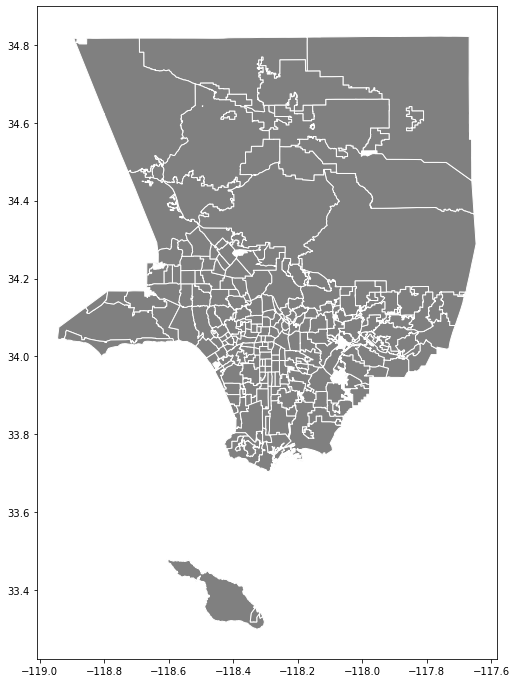

In [124]:
ax= merged_hood_words.plot(figsize=(12,12), 
            color='grey', edgecolor='white')

[]

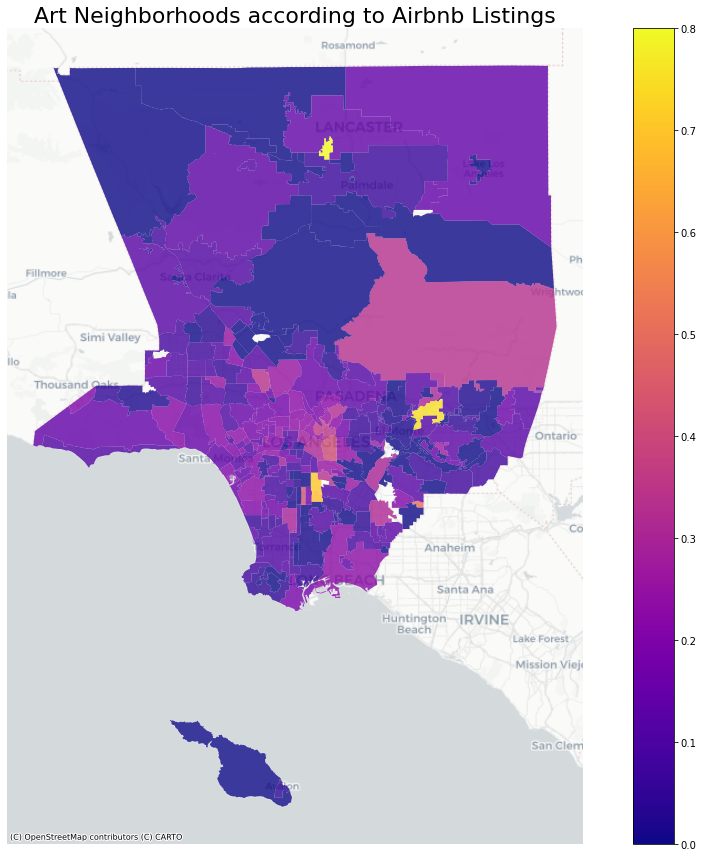

In [138]:
# Now we plot it on a map with a different color gradient
merged_hood_words = merged_hood_words.to_crs(epsg=3857)
ax = merged_hood_words.plot(figsize=(18,15),
                        column='art',
                        legend=True,
                        alpha=0.8,
                        cmap='plasma',    
                        vmin=0)

ax.axis('off')
ax.set_title('Art Neighborhoods according to Airbnb Listings',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.plot()

In [226]:
# try a folium map

import folium

cal = folium.Map(location=[34,-118.2],tiles='cartodbpositron',)

# choropleth map of percent
folium.Choropleth(
    merged_hood_words, # the geodataframe
    data=merged_hood_words, # the data is in the geodataframe, so same value
    key_on= 'feature.properties.neighbourhood',# the id column
    columns=['neighbourhood', 'walk'], # the id column, followed by the variable to map
    fill_color='BuPu', # color scheme
    fill_opacity=0.8, 
    line_opacity=0.1, 
    legend_name="Percent of listings with the word walk",
    name="Walkable Neighborhoods according to Airbnb Listings", # name the layer
    vmin=0,
).add_to(cal)

# output the map
cal

In [231]:
# try a folium map

import folium

cal = folium.Map(location=[34,-118.2],tiles='cartodbpositron',)

# choropleth map of percent
folium.Choropleth(
    merged_hood_words, # the geodataframe
    data=merged_hood_words, # the data is in the geodataframe, so same value
    key_on= 'feature.properties.neighbourhood',# the id column
    columns=['neighbourhood', 'shop'], # the id column, followed by the variable to map
    fill_color='BuPu', # color scheme
    fill_opacity=0.8, 
    line_opacity=0.1, 
    legend_name="Percent of listings with the word shop",
    name="Shop Neighborhoods according to Airbnb Listings", # name the layer
    vmin=0,
).add_to(cal)

# output the map
cal

In [227]:
merged_hood_words.sort_values(by=['walk'])

,neighbourhood,neighbourhood_group,geometry,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Angeles Crest,Unincorporated Areas,"MULTIPOLYGON (((-13146461.169 4092557.670, -13...",Angeles Crest,0.000000,0.333333,0.000000,0.000,0.000000,0.000000,0.000000,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000
61,Northwest Palmdale,Unincorporated Areas,"MULTIPOLYGON (((-13153076.997 4115847.376, -13...",Northwest Palmdale,0.250000,0.125000,0.000000,0.125,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
31,Mayflower Village,Unincorporated Areas,"MULTIPOLYGON (((-13136139.848 4046311.043, -13...",Mayflower Village,0.029412,0.088235,0.000000,0.000,0.000000,0.029412,0.088235,0.088235,0.029412,0.000000,0.000000,0.117647,0.000000
126,Ridge Route,Unincorporated Areas,"MULTIPOLYGON (((-13205713.305 4096306.806, -13...",Ridge Route,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
33,Lopez/Kagel Canyons,Unincorporated Areas,"MULTIPOLYGON (((-13177556.042 4071713.012, -13...",Lopez/Kagel Canyons,0.000000,0.000000,0.250000,0.000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,San Fernando,Other Cities,"MULTIPOLYGON (((-13182840.044 4068660.571, -13...",San Fernando,0.000000,0.100000,0.000000,0.000,0.000000,0.600000,0.000000,0.000000,0.000000,0.000000,0.500000,0.100000,0.000000
165,Atwater Village,City of Los Angeles,"MULTIPOLYGON (((-13164421.344 4045216.141, -13...",Atwater Village,0.082353,0.105882,0.070588,0.000,0.035294,0.517647,0.505882,0.176471,0.058824,0.011765,0.505882,0.129412,0.011765
151,Highland Park,City of Los Angeles,"MULTIPOLYGON (((-13156753.435 4046517.475, -13...",Highland Park,0.018634,0.062112,0.111801,0.000,0.031056,0.465839,0.347826,0.322981,0.012422,0.018634,0.509317,0.124224,0.018634
11,Citrus,Unincorporated Areas,"MULTIPOLYGON (((-13124981.182 4044056.538, -13...",Citrus,0.000000,0.200000,0.000000,0.000,0.000000,0.200000,0.400000,0.000000,0.000000,0.000000,0.600000,0.000000,0.000000


# 2. Just focus on the gentrifying neighborhoods


In [160]:
gent_df = pd.read_csv('data/join_list_gent.csv')
gent_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2218 entries, 0 to 2217
Data columns (total 90 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            2218 non-null   int64  
 1   listing_url                                   2218 non-null   object 
 2   scrape_id                                     2218 non-null   int64  
 3   last_scraped                                  2218 non-null   object 
 4   name_left                                     2218 non-null   object 
 5   description                                   2117 non-null   object 
 6   neighborhood_overview                         1326 non-null   object 
 7   picture_url                                   2218 non-null   object 
 8   host_id                                       2218 non-null   int64  
 9   host_url                                      2218 non-null   o

In [161]:
# convert to string and lower case
gent_df['neighborhood_overview']=gent_df.neighborhood_overview.astype(str)
gent_df['neighborhood_overview']=gent_df.neighborhood_overview.str.lower()

for i in range(length):
    gent_df[list[i]]=gent_df.neighborhood_overview.apply(lambda x: check_words(x,list[i]))
    
gent_df.sample(20)

,id,listing_url,scrape_id,last_scraped,name_left,description,neighborhood_overview,picture_url,host_id,host_url,...,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
1329,16220943,https://www.airbnb.com/rooms/16220943,20210207181900,2021-02-10,Private room with private 1/4 bath,"Private room, with a lock. Also has a private ...",nan,https://a0.muscache.com/pictures/b028fe77-a701...,42409124,https://www.airbnb.com/users/show/42409124,...,False,False,False,False,False,False,False,False,False,False
922,22653403,https://www.airbnb.com/rooms/22653403,20210207181900,2021-02-08,Near LAX & Forum Private room-bathroom-entrance,Minutes from LAX & The Forum. <br />Spacious p...,home is located in a quiet and safe residentia...,https://a0.muscache.com/pictures/6edf8e54-4ade...,108213986,https://www.airbnb.com/users/show/108213986,...,False,False,False,False,False,False,False,False,False,False
1944,37322635,https://www.airbnb.com/rooms/37322635,20210207181900,2021-02-10,Guest Suite with Kitchenette and Private Entrance,Comfortable and bright private guest suite wit...,we are in a central location for many attracti...,https://a0.muscache.com/pictures/3e370d14-dbcc...,52188890,https://www.airbnb.com/users/show/52188890,...,False,False,True,True,True,False,False,True,False,False
1549,45742469,https://www.airbnb.com/rooms/45742469,20210207181900,2021-02-10,Private safe back of house. Private entrance.,"Fast wifi, small koi pond. BBQ, central locati...",several locally owned restaurants within two b...,https://a0.muscache.com/pictures/miso/Hosting-...,211543186,https://www.airbnb.com/users/show/211543186,...,False,False,True,True,False,False,False,False,False,False
485,13059917,https://www.airbnb.com/rooms/13059917,20210207181900,2021-02-08,NoHo Master Bedroom,Master bedroom in the NoHo Arts District. Ver...,nan,https://a0.muscache.com/pictures/eac3891c-a74d...,293291,https://www.airbnb.com/users/show/293291,...,False,False,False,False,False,False,False,False,False,False
1914,32009090,https://www.airbnb.com/rooms/32009090,20210207181900,2021-02-09,洛杉矶*熙臻行馆Monet精装雅房,美国加州洛杉矶蒙市大西洋时代广场高级公寓精装雅房。有独立卫生间，淋浴需要共享。整洁干净，全新...,紧邻10号高速公路。,https://a0.muscache.com/pictures/5581bc7d-f19c...,183748799,https://www.airbnb.com/users/show/183748799,...,False,False,False,False,False,False,False,False,False,False
1377,24451896,https://www.airbnb.com/rooms/24451896,20210207181900,2021-02-09,Stunning 2BD/1BA in Downtown Alhambra Main St!,Stunning 2 Bedroom/1 Bathroom smart-home condo...,perfect for the curious foodie! located on mai...,https://a0.muscache.com/pictures/04d373c4-0975...,109167908,https://www.airbnb.com/users/show/109167908,...,False,False,True,True,False,False,False,False,False,False
26,4766976,https://www.airbnb.com/rooms/4766976,20210207181900,2021-02-09,The Sunflower Room+Parking - Centrally Located,This is a spacious 3 bedroom craftsman style h...,"right next to 101 freeway, walking distance fr...",https://a0.muscache.com/pictures/f42df564-2bdd...,24592484,https://www.airbnb.com/users/show/24592484,...,False,False,False,False,False,False,False,True,False,False
842,6822277,https://www.airbnb.com/rooms/6822277,20210207181900,2021-02-10,Spacious Bedroom with Private bathroom-LAX,"House in safe gated Community. Comfortable, qu...",not the nicest area but safe environment.<br /...,https://a0.muscache.com/pictures/2f5245cb-788c...,35729024,https://www.airbnb.com/users/show/35729024,...,False,False,True,True,True,False,False,True,True,False
574,25841545,https://www.airbnb.com/rooms/25841545,20210207181900,2021-02-09,Long Term Apartment for Rent,Spacious beautiful 3 Bedroom 2.5 Bathroom apar...,nan,https://a0.muscache.com/pictures/7ad02e18-4589...,134939188,https://www.airbnb.com/users/show/134939188,...,False,False,False,False,False,False,False,False,False,False


In [162]:
def group_gent(keyword):
    by_hoods = gent_df.groupby("neighbourhood_cleansed")[keyword].mean()
    by_hoods_df = pd.DataFrame(by_hoods).reset_index()
    return by_hoods_df

In [163]:
safe_df = group_gent('safe')
quiet_df = group_gent('quiet')
beautiful_df = group_gent('beautiful')
exclusive_df = group_gent('exclusive')
famous_df = group_gent('famous')
restaurants_df = group_gent('restaurants')
shop_df = group_gent('shop')
art_df = group_gent('art')
trail_df = group_gent('trail')
views_df = group_gent('views')
walk_df = group_gent('walk')
drive_df = group_gent('drive')
parking_df = group_gent('parking')

In [164]:
# join the individual data frames together

hood_words_gent = pd.concat((iDF.set_index('neighbourhood_cleansed') for iDF in [safe_df, quiet_df, beautiful_df, exclusive_df, famous_df, restaurants_df, shop_df, art_df, trails_df, views_df, walk_df, drive_df, parking_df]),
    axis=1, join='inner').reset_index()

hood_words_gent.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   neighbourhood_cleansed  16 non-null     object 
 1   safe                    16 non-null     float64
 2   quiet                   16 non-null     float64
 3   beautiful               16 non-null     float64
 4   exclusive               16 non-null     float64
 5   famous                  16 non-null     float64
 6   restaurants             16 non-null     float64
 7   shop                    16 non-null     float64
 8   art                     16 non-null     float64
 9   trail                   16 non-null     float64
 10  views                   16 non-null     float64
 11  walk                    16 non-null     float64
 12  drive                   16 non-null     float64
 13  parking                 16 non-null     float64
dtypes: float64(13), object(1)
memory usage: 1.9+

In [165]:
hood_words_gent.head(20)

,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Alhambra,0.140000,0.156667,0.016667,0.000000,0.006667,0.180000,0.140000,0.056667,0.000000,0.003333,0.183333,0.046667,0.006667
1,Azusa,0.188679,0.132075,0.018868,0.000000,0.000000,0.132075,0.132075,0.094340,0.132075,0.000000,0.264151,0.000000,0.018868
2,Commerce,0.125000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000
3,East Hollywood,0.045455,0.043062,0.040670,0.000000,0.057416,0.236842,0.181818,0.234450,0.018957,0.007177,0.327751,0.090909,0.031100
4,East Los Angeles,0.054688,0.132812,0.031250,0.000000,0.039062,0.218750,0.109375,0.234375,0.007812,0.046875,0.242188,0.109375,0.007812
5,Hollywood,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.018880,0.000000,1.000000,0.000000,0.000000
6,Industry,0.060606,0.060606,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,Inglewood,0.096491,0.138158,0.035088,0.002193,0.050439,0.111842,0.138158,0.081140,0.008753,0.015351,0.199561,0.092105,0.013158
8,Larchmont,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
9,Monterey Park,0.090909,0.114625,0.007905,0.003953,0.000000,0.118577,0.083004,0.059289,0.007905,0.000000,0.083004,0.047431,0.011858


In [166]:
# some extra ones showed up for some reason so let's get rid of Hollywood, Larchmont, and Rosemead
hood_words_gent = hood_words_gent.drop(labels=[5,8,13], axis=0)
hood_words_gent = hood_words_gent.reset_index(drop=True)
hood_words_gent.head(20)

,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Alhambra,0.140000,0.156667,0.016667,0.000000,0.006667,0.180000,0.140000,0.056667,0.000000,0.003333,0.183333,0.046667,0.006667
1,Azusa,0.188679,0.132075,0.018868,0.000000,0.000000,0.132075,0.132075,0.094340,0.132075,0.000000,0.264151,0.000000,0.018868
2,Commerce,0.125000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000
3,East Hollywood,0.045455,0.043062,0.040670,0.000000,0.057416,0.236842,0.181818,0.234450,0.018957,0.007177,0.327751,0.090909,0.031100
4,East Los Angeles,0.054688,0.132812,0.031250,0.000000,0.039062,0.218750,0.109375,0.234375,0.007812,0.046875,0.242188,0.109375,0.007812
5,Industry,0.060606,0.060606,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,Inglewood,0.096491,0.138158,0.035088,0.002193,0.050439,0.111842,0.138158,0.081140,0.008753,0.015351,0.199561,0.092105,0.013158
7,Monterey Park,0.090909,0.114625,0.007905,0.003953,0.000000,0.118577,0.083004,0.059289,0.007905,0.000000,0.083004,0.047431,0.011858
8,North Hollywood,0.113372,0.177326,0.046512,0.000000,0.043605,0.308140,0.186047,0.337209,0.017442,0.005814,0.316860,0.093023,0.043605
9,Pico Rivera,0.138889,0.305556,0.000000,0.000000,0.000000,0.222222,0.388889,0.305556,0.027027,0.000000,0.111111,0.027778,0.083333


In [167]:
merged_genthood_words = pd.merge(left=hood_poly, right=hood_words_gent, left_on='neighbourhood', right_on='neighbourhood_cleansed', how="right")
merged_genthood_words.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 13 entries, 0 to 12
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   neighbourhood           13 non-null     object  
 1   neighbourhood_group     13 non-null     object  
 2   geometry                13 non-null     geometry
 3   neighbourhood_cleansed  13 non-null     object  
 4   safe                    13 non-null     float64 
 5   quiet                   13 non-null     float64 
 6   beautiful               13 non-null     float64 
 7   exclusive               13 non-null     float64 
 8   famous                  13 non-null     float64 
 9   restaurants             13 non-null     float64 
 10  shop                    13 non-null     float64 
 11  art                     13 non-null     float64 
 12  trail                   13 non-null     float64 
 13  views                   13 non-null     float64 
 14  walk                

In [169]:
# try a folium map

cal = folium.Map(location=[34,-118.2],tiles='cartodbpositron',)

# choropleth map of percent
folium.Choropleth(
    merged_genthood_words, # the geodataframe
    data=merged_genthood_words, # the data is in the geodataframe, so same value
    key_on= 'feature.properties.neighbourhood',# the id column
    columns=['neighbourhood', 'walk'], # the id column, followed by the variable to map
    fill_color='BuGn', # color scheme
    fill_opacity=0.4, 
    line_opacity=0.1, 
    legend_name="Percent of listings with the word walk",
    name="Walk Friendly Neighborhoods according to Airbnb", # name the layer
    vmin=0
).add_to(cal)

# output the map
cal

In [211]:
# Group by neighborhood for each of the words
# Words for Adjectives: Safe, Quiet, Beautiful, Exclusive, Famous
# Words for Amenities: Restaurants, Shop, Art, Trail, Views
# Words for Mobility: Walk, Drive, Parking
# try plotly bars https://plotly.com/python/bar-charts/

import plotly.graph_objects as go
hoodnames=merged_genthood_words['neighbourhood']
safe=merged_genthood_words['safe']
beautiful=merged_genthood_words['beautiful']
exclusive=merged_genthood_words['exclusive']
famous=merged_genthood_words['famous']

fig = go.Figure(data=[
    go.Bar(name='safe', x=hoodnames, y=safe),
    go.Bar(name='quiet', x=hoodnames, y=quiet),
    go.Bar(name='beautiful', x=hoodnames, y=beautiful),
    go.Bar(name='exclusive', x=hoodnames, y=exclusive),
    go.Bar(name='famous', x=hoodnames, y=famous),
    ])
# Change the bar mode
fig.update_layout(barmode='group', yaxis_range=[0,.45], title="Gentrifying Neighborhoods: Percent of Airbnb Listings with Selected Adjectives")
fig.show()

In [210]:
# Words for Amenities: Restaurants, Shop, Art, Trail, Views

hoodnames=merged_genthood_words['neighbourhood']
restaurants=merged_genthood_words['restaurants']
shop=merged_genthood_words['shop']
art=merged_genthood_words['art']
trail=merged_genthood_words['trail']
views=merged_genthood_words['views']

fig = go.Figure(data=[
    go.Bar(name='restaurants', x=hoodnames, y=restaurants),
    go.Bar(name='shop', x=hoodnames, y=shop),
    go.Bar(name='art', x=hoodnames, y=art),
    go.Bar(name='trail', x=hoodnames, y=trail),
    go.Bar(name='views', x=hoodnames, y=views),
])
# Change the bar mode
fig.update_layout(barmode='group',yaxis_range=[0,.45],title="Gentrifying Neighborhoods: Percent of Airbnb Listings with Selected Amenities")
fig.show()

In [209]:
# Words for for Mobility: Walk, Drive, Parking

hoodnames=merged_genthood_words['neighbourhood']
restaurants=merged_genthood_words['restaurants']
walk=merged_genthood_words['walk']
drive=merged_genthood_words['drive']
parking=merged_genthood_words['parking']

fig = go.Figure(data=[
    go.Bar(name='walk', x=hoodnames, y=walk),
    go.Bar(name='drive', x=hoodnames, y=drive),
    go.Bar(name='parking', x=hoodnames, y=parking),
])
# Change the bar mode
fig.update_layout(barmode='group', yaxis_range=[0,.45], title="Gentrifying Neighborhoods: Percent of Airbnb Listings with Selected Mobility Keywords")
fig.show()